In [1]:
import os
import sys
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
plt.rcParams["figure.figsize"] = (24,18)

from cv_utils import *
from houghlines_process import *

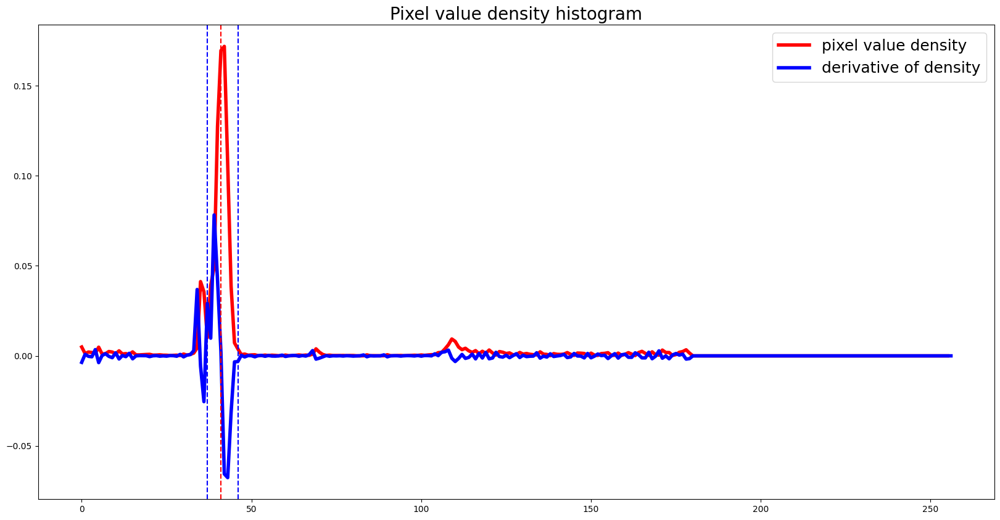

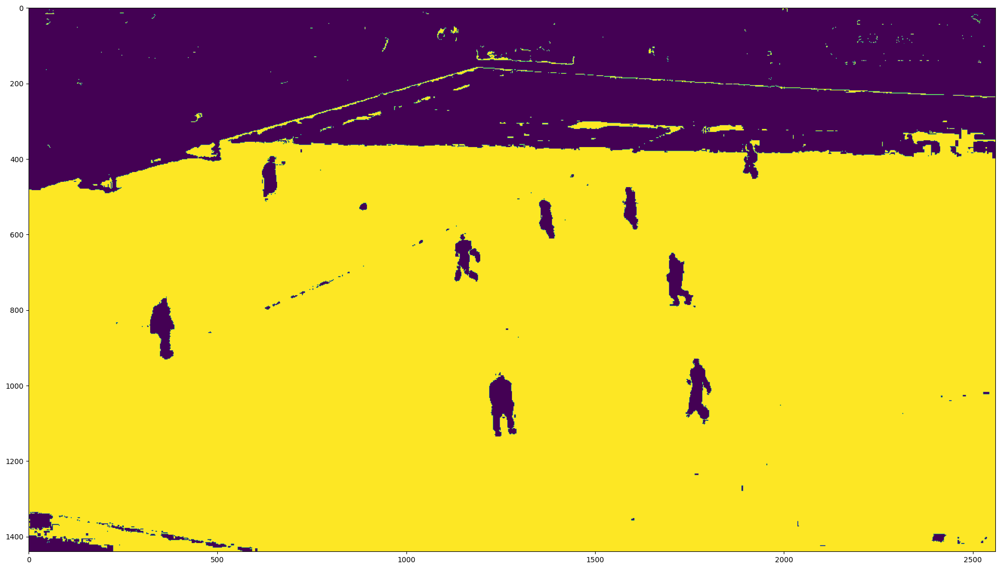

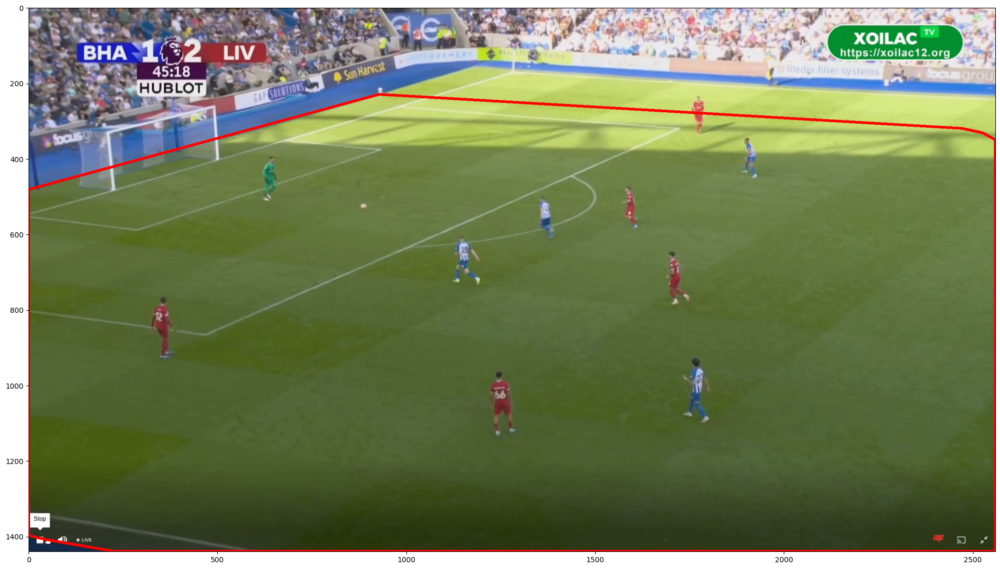

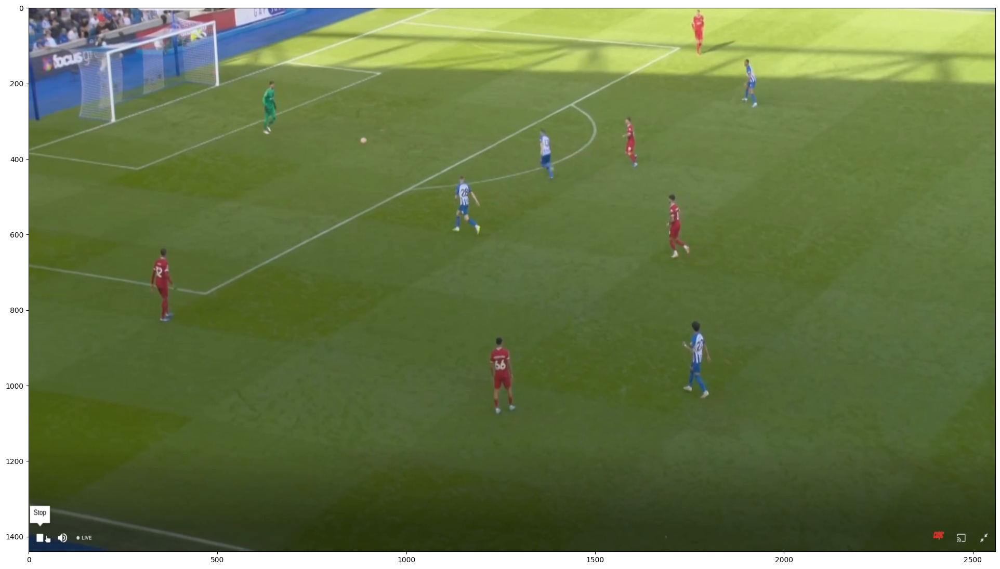

In [2]:
data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')
vid_name = 'real_test'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)

image_path = os.path.join(images_path, '000000000058_1.png')#sorted(os.listdir(images_path))[8])
rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

cropped_image = pitch_segment(rgb_image, visualize=True)
orig_h, orig_w, _ = cropped_image.shape

plt.figure()
plt.imshow(cropped_image[:, :, ::-1])

### Detect and filter out players and filter pitch area only

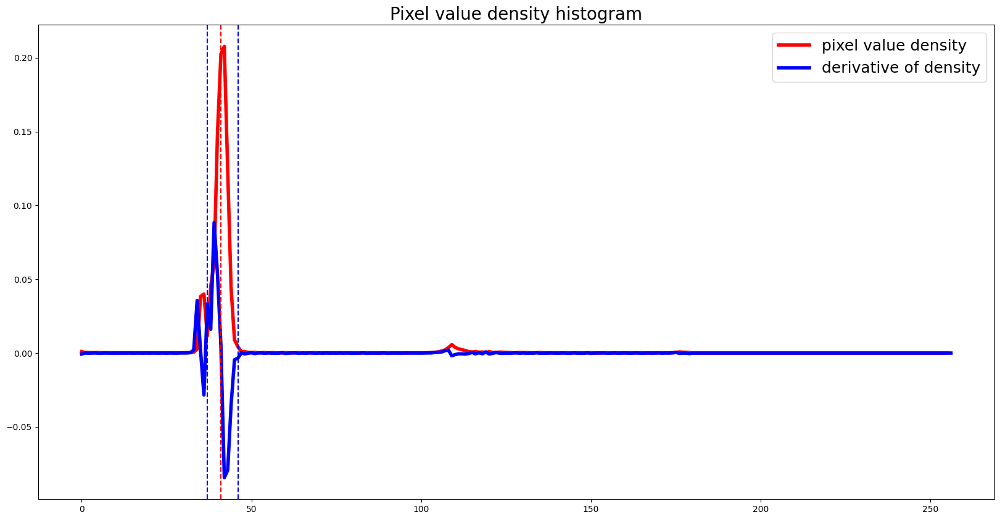

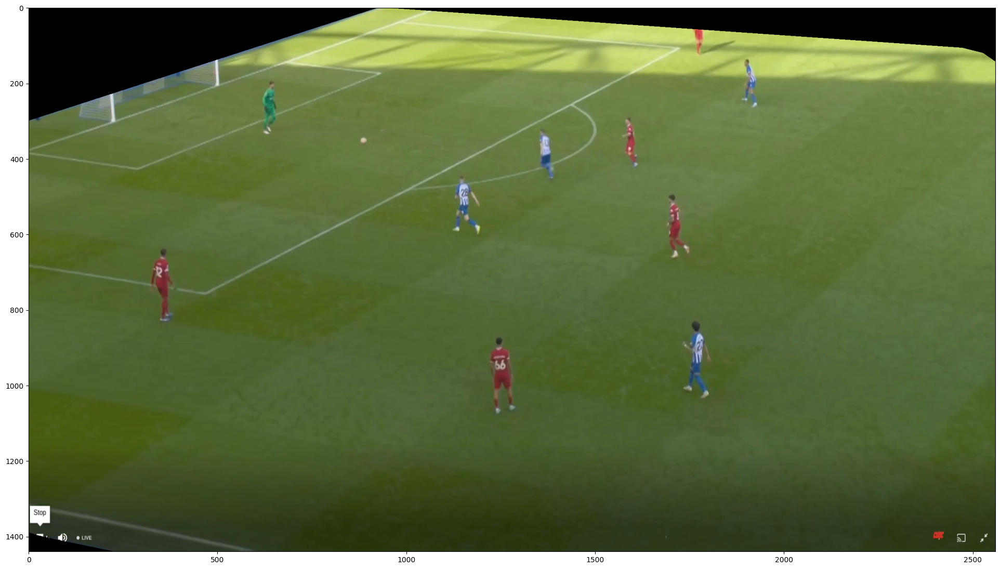

In [3]:
hsv_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2HSV)
hue = hsv_image[:, :, 0]
start_index, stop_index = find_peak_range(hue, visualize=True)
lower_green = start_index
upper_green = stop_index

mask_green = cv2.inRange(hue, lower_green, upper_green)
# plt.figure()
# plt.imshow(mask_green)

_, rect, hull = detect_largest_contour(mask_green)
# temp = rgb_image.copy()
# cv2.polylines(temp, [hull], True, (255, 0, 0), 3)
# plt.figure()
# plt.imshow(temp[:, :, ::-1])

mask = np.zeros_like(cropped_image)
cv2.fillPoly(mask, [hull], (255, 255, 255))
# plt.figure()
# plt.imshow(mask)

pitch_cropped_image = cv2.bitwise_and(cropped_image, mask)
plt.figure()
plt.imshow(pitch_cropped_image[:, :, ::-1])


0: 576x1024 10 persons, 1 ball, 6.4ms
Speed: 3.5ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 1024)


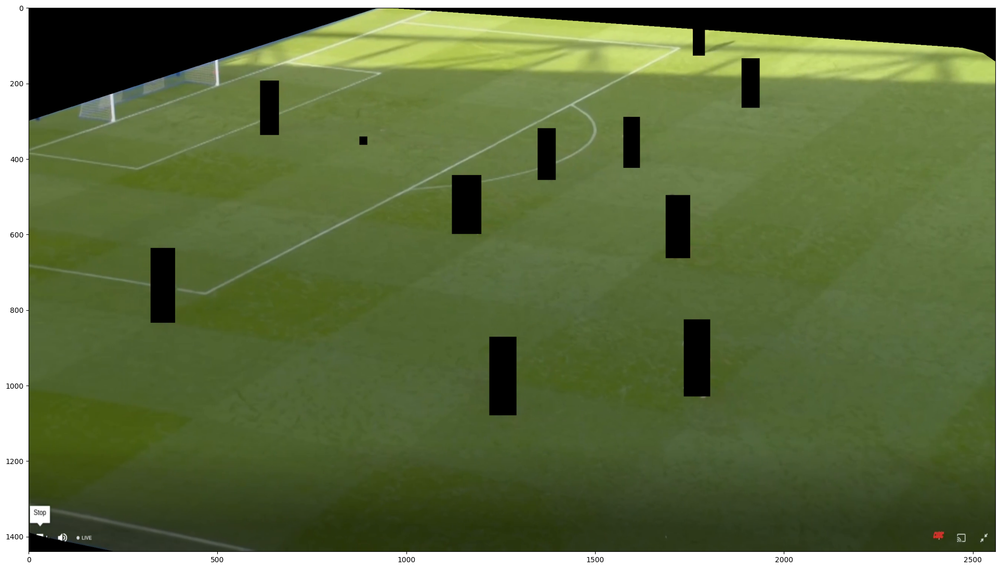

In [4]:
filtered_player_image = pitch_cropped_image.copy()

model_path = os.path.join(os.path.dirname(os.getcwd()), 'models')
model = YOLO(os.path.join(model_path, "yolov8n_2nd_train.pt"))

# Remove players from the image using YOLO predictions:
results = model.predict(pitch_cropped_image)
for result in results:
    boxes = result.boxes
    classes = result.names
    for box in boxes:
        coord = box.xyxy.cpu().detach().int().tolist()[0]
        (startX, startY, endX, endY) = coord

        # Draw black rectangle on the mask using bounding box coordinates
        cv2.rectangle(filtered_player_image, [startX, startY], [endX, endY], (0, 0, 0), -1)

plt.figure()
plt.imshow(filtered_player_image[:, :, ::-1])

### Filter white pixel

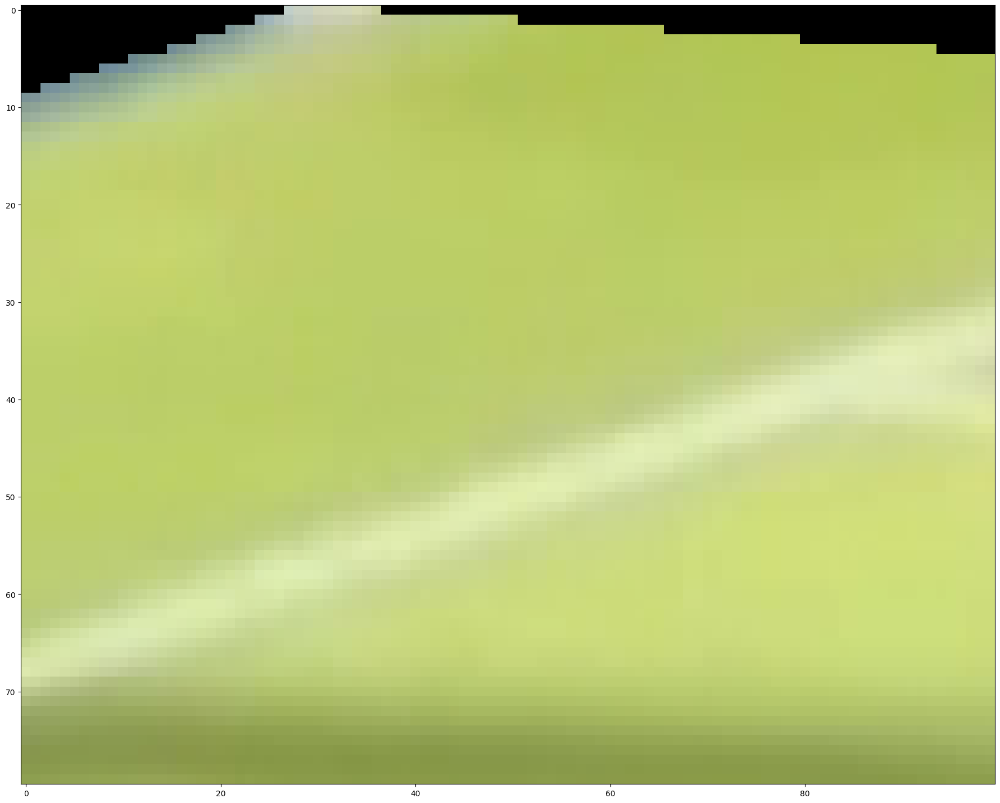

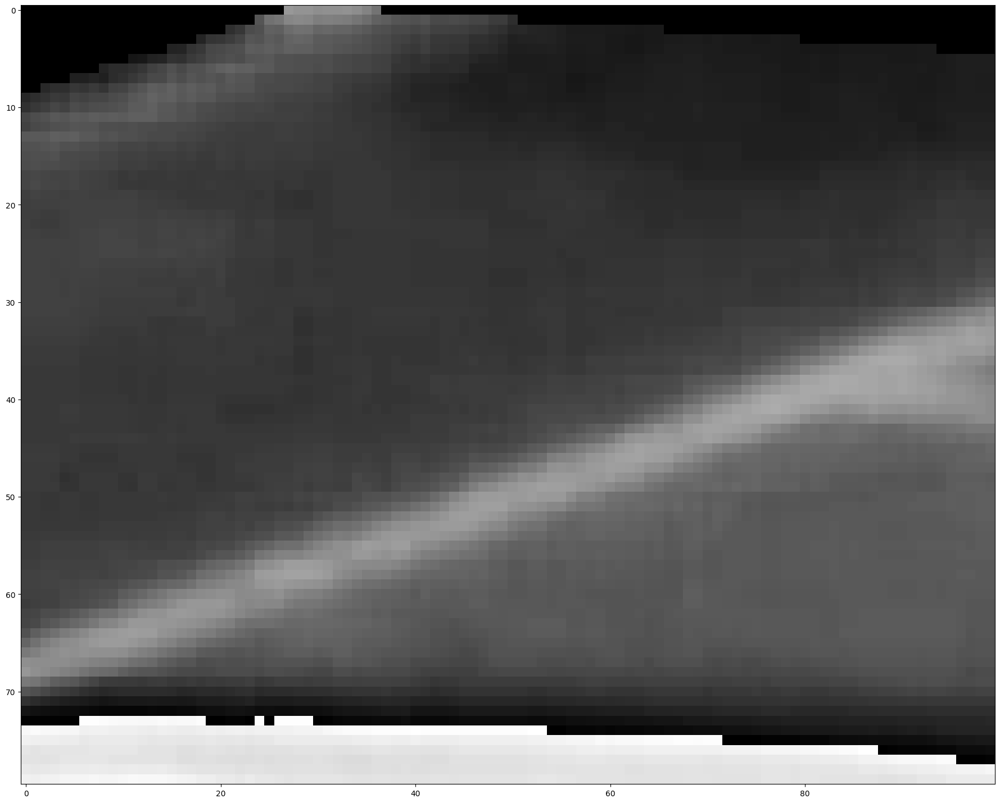

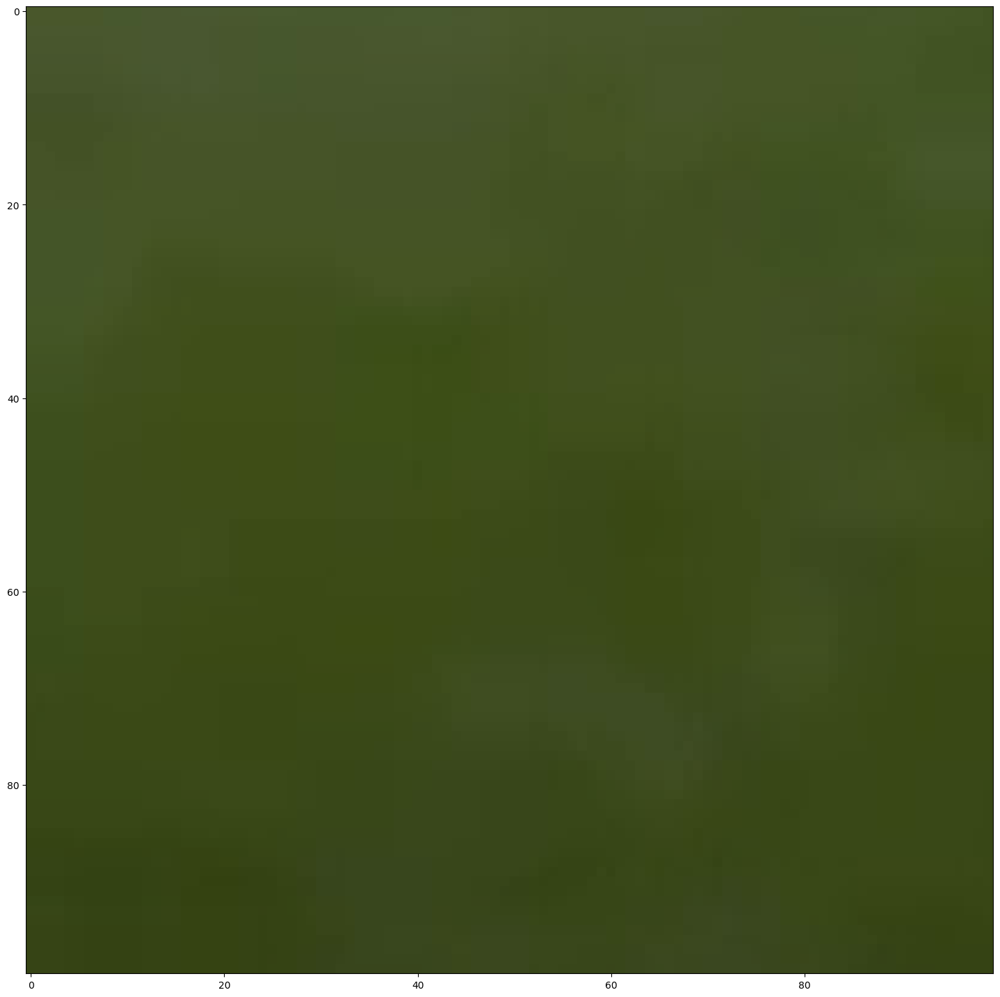

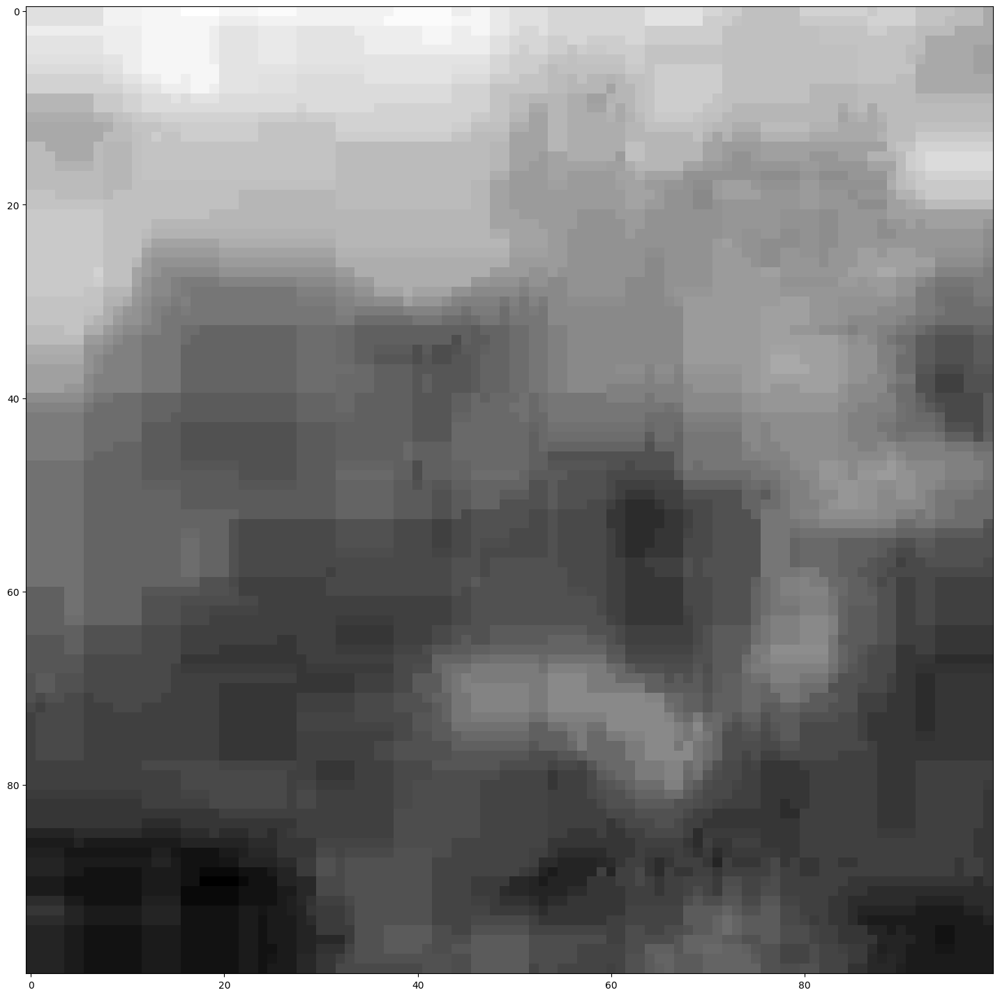

In [5]:
temp = filtered_player_image.copy()[0:80, 900:1000]
plt.figure()
plt.imshow(temp[:, :, ::-1])
temp = (temp[:, :, 0] + temp[:, :, 1])/2
plt.figure()
plt.imshow(temp, cmap='gray')

temp = filtered_player_image.copy()[1200:1300, 900:1000]
plt.figure()
plt.imshow(temp[:, :, ::-1])
temp = (temp[:, :, 0] + temp[:, :, 1])/2
plt.figure()
plt.imshow(temp, cmap='gray')

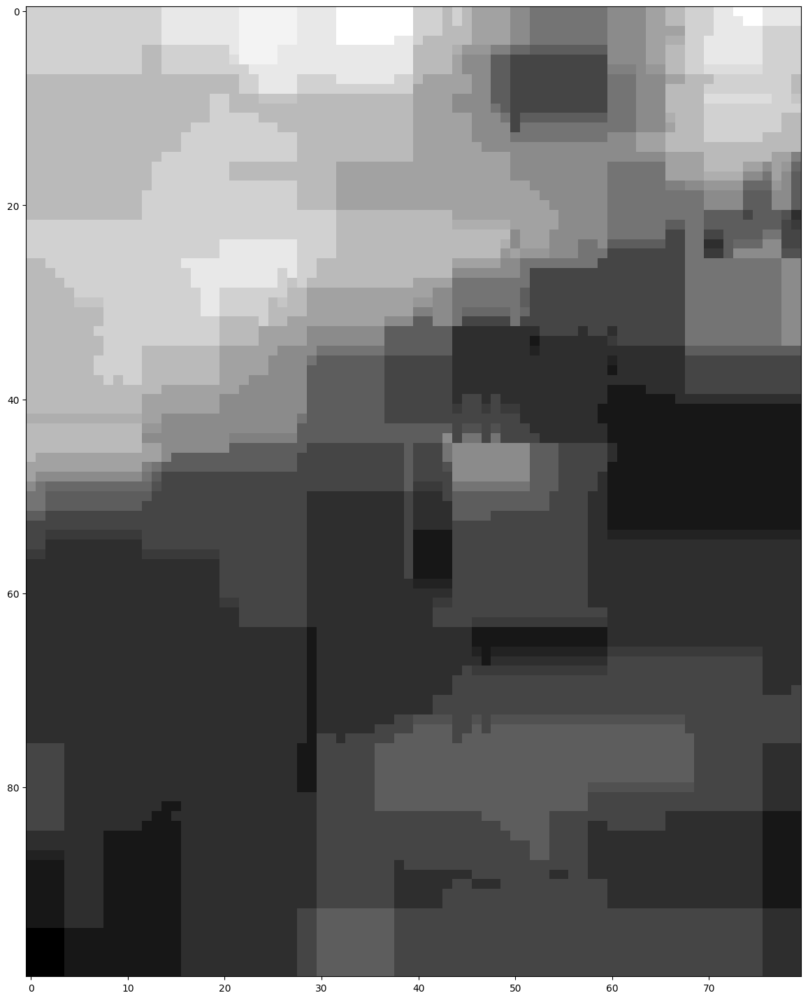

In [6]:
temp = filtered_player_image.copy()
temp = (temp[900:1000, 100:180, 0] + temp[900:1000, 100:180, 1])/2
plt.figure()
plt.imshow(temp, cmap='gray')

151


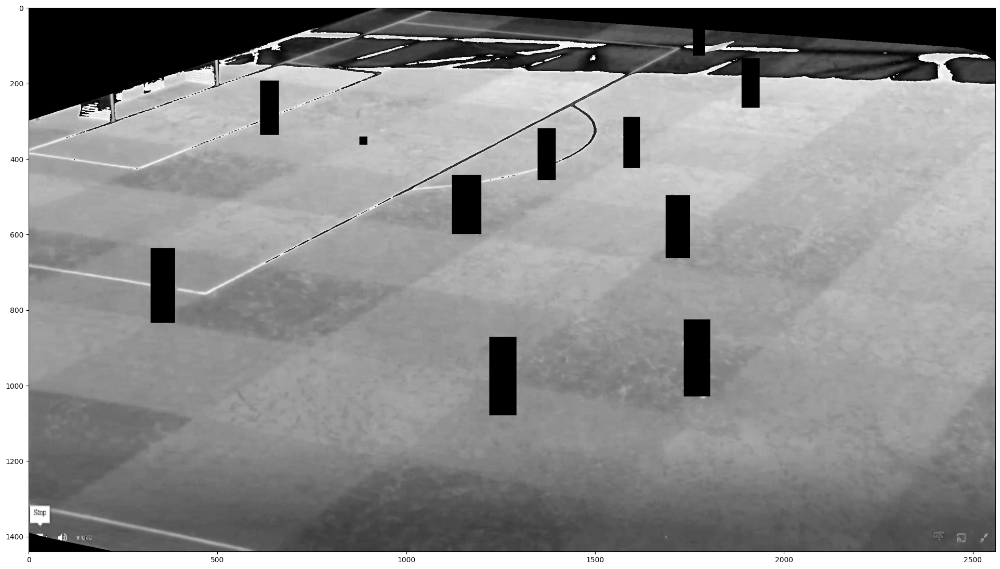

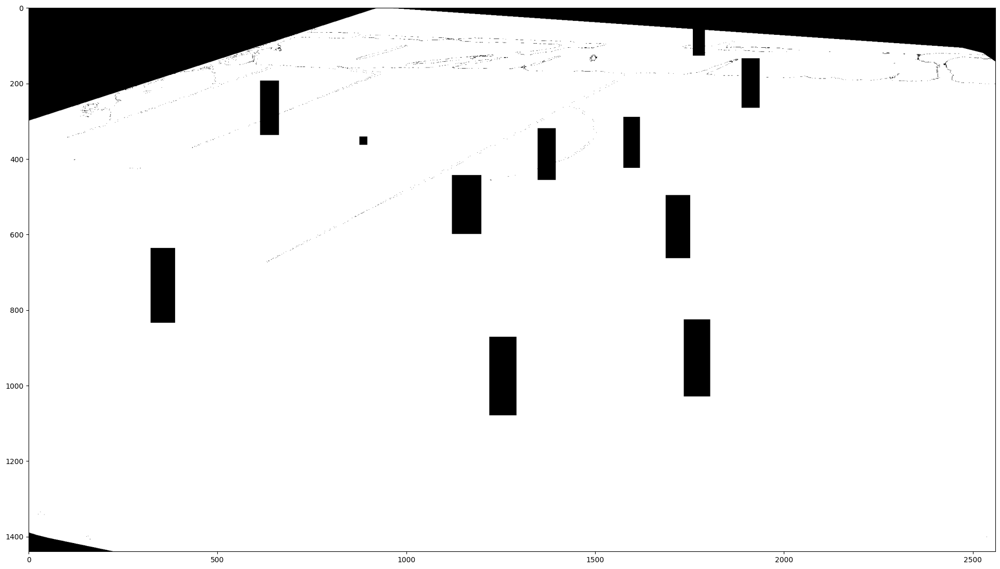

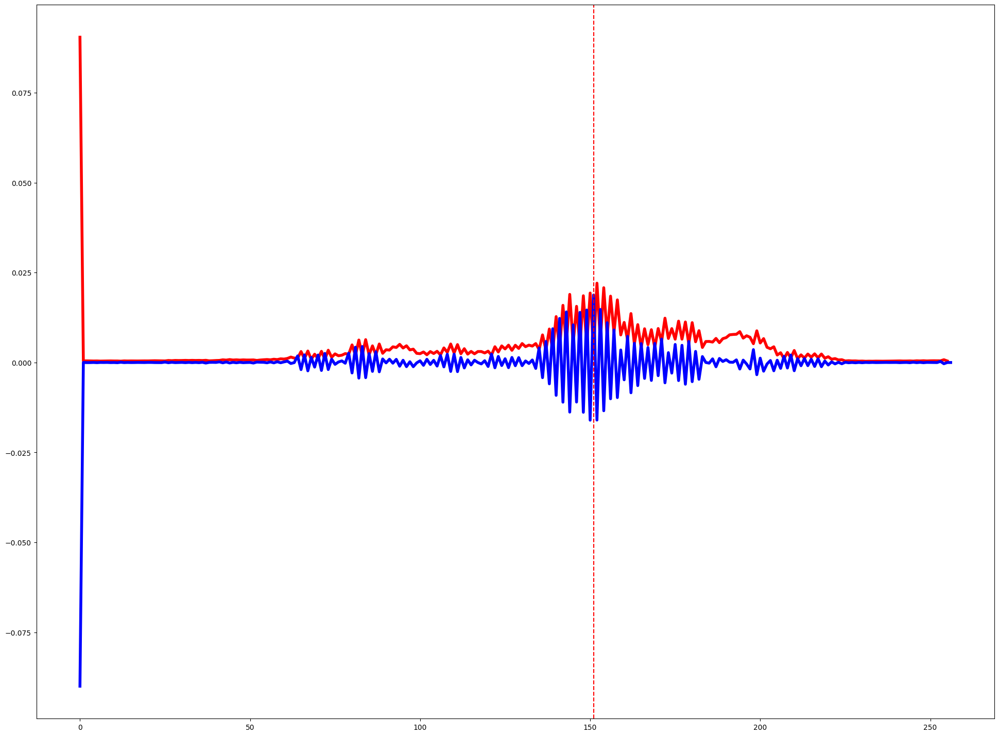

In [7]:
temp = filtered_player_image.copy()
temp = (temp[:, :, 0] + temp[:, :, 1])
plt.figure()
plt.imshow(temp, cmap='gray')

hist = np.histogram(temp, bins=range(257), range=(0, 255), density=True)
values = hist[0]
indices = hist[1]
# Calculate the derivative of the histogram
derivative = np.diff(values[1:])

# Finding the index of the highest peak
peak_index = np.argmax(values[1:])
print(peak_index)

_, thresh = cv2.threshold(temp, 1, 10, cv2.THRESH_BINARY)
plt.figure()
plt.imshow(thresh, cmap='gray')


# Calculate the derivative of the histogram
derivative = np.append(np.diff(values), [0])
plt.figure()
plt.plot(indices[:-1], values, lw=4, color='r', label='pixel value density')
plt.plot(indices, np.append(derivative, [0]), lw=4, color='b', label='derivative of density')
plt.axvline(x = peak_index, color='r', linestyle='dashed')

129


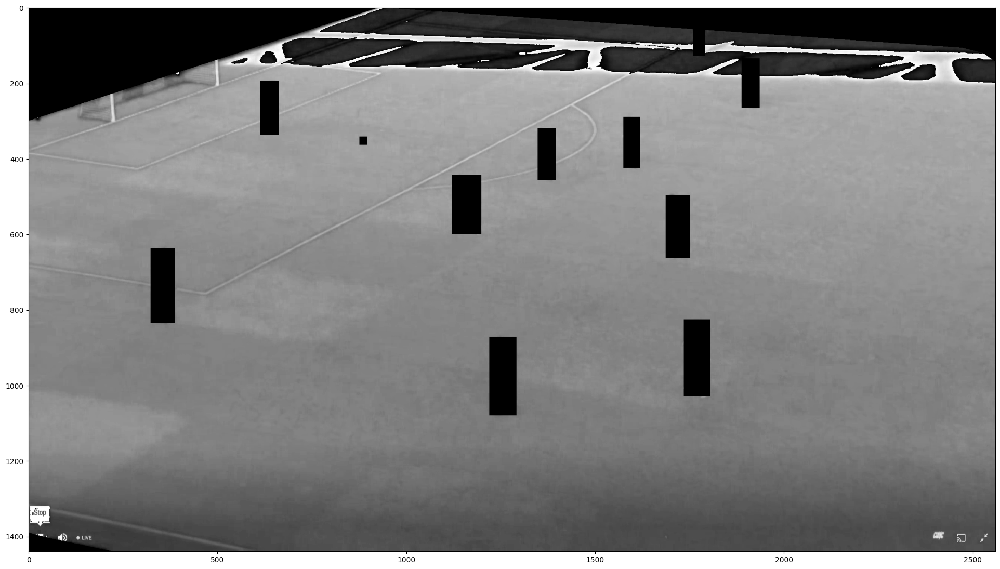

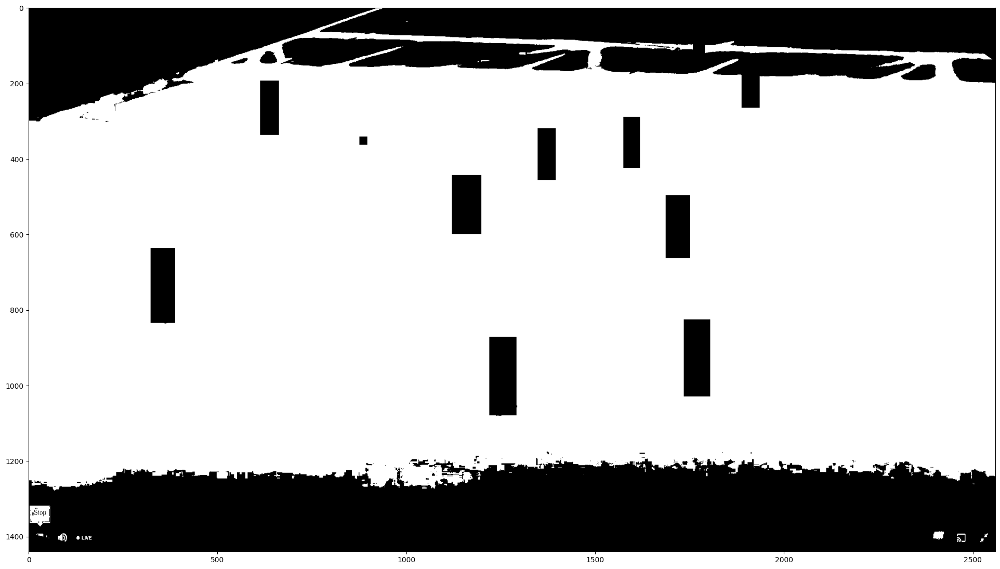

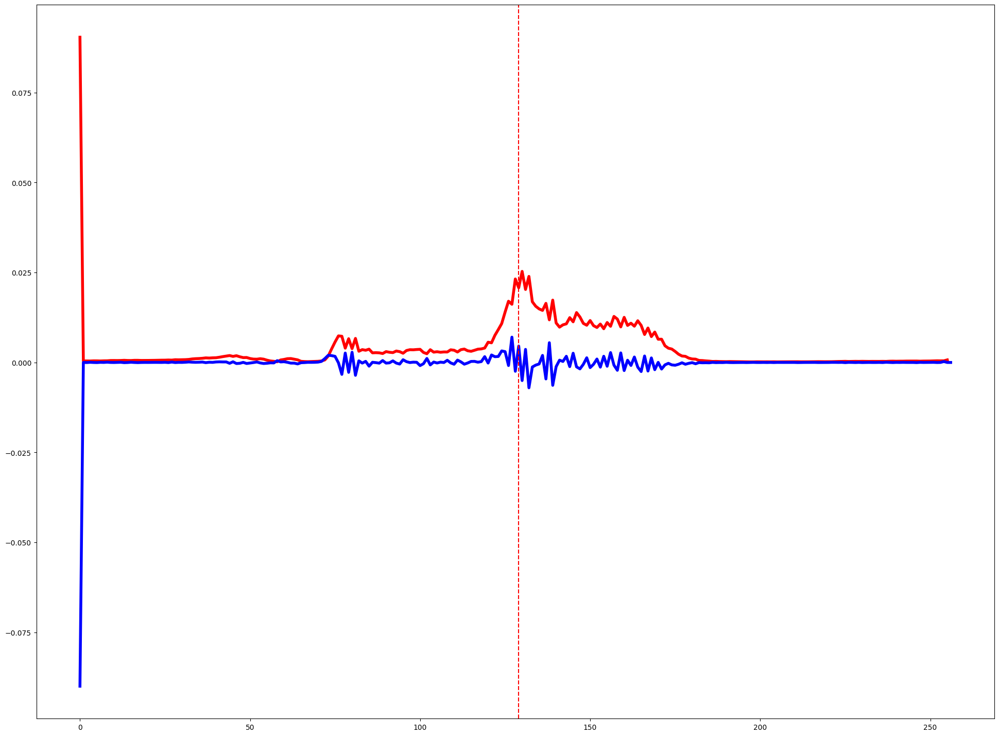

In [8]:
temp = filtered_player_image.copy()
temp = temp[:,:, 1] - temp[:, :, 0] + temp[:, :, 2]
#temp = cv2.cvtColor(filtered_player_image, cv2.COLOR_RGB2GRAY)
plt.figure()
plt.imshow(temp, cmap='gray')

hist = np.histogram(temp, bins=range(257), range=(0, 255), density=True)
values = hist[0]
indices = hist[1]
# Calculate the derivative of the histogram
derivative = np.diff(values[1:])

# Finding the index of the highest peak
peak_index = np.argmax(values[1:])
print(peak_index)

_, thresh = cv2.threshold(temp, 110, 255, cv2.THRESH_BINARY)
plt.figure()
plt.imshow(thresh, cmap='gray')


# Calculate the derivative of the histogram
derivative = np.append(np.diff(values), [0])
plt.figure()
plt.plot(indices[:-1], values, lw=4, color='r', label='pixel value density')
plt.plot(indices, np.append(derivative, [0]), lw=4, color='b', label='derivative of density')
plt.axvline(x = peak_index, color='r', linestyle='dashed')

[201 207 193]
False
[201 207 193]
False
[201 207 193]
False
[194 209 201]
False
[194 209 201]
False
[194 209 201]
False
[194 209 201]
False
[194 209 201]
False
[194 209 201]
False
[186 212 210]
False
[186 212 210]
False
[186 212 210]
False
[187 213 211]
False
[187 213 211]
False
[187 213 211]
False
[185 215 211]
False
[185 215 211]
False
[185 215 211]
False
[186 216 212]
False
[186 216 212]
False
[186 216 212]
False
[179 218 215]
False
[179 218 215]
False
[179 218 215]
False
[174 213 210]
False
[174 213 210]
False
[174 213 210]
False
[161 210 204]
False
[161 210 204]
False
[161 210 204]
False
[173 168 148]
False
[173 168 148]
False
[173 168 148]
False
[187 182 162]
False
[187 182 162]
False
[187 182 162]
False
[184 190 176]
False
[184 190 176]
False
[184 190 176]
False
[192 198 184]
False
[192 198 184]
False
[192 198 184]
False
[189 204 195]
False
[189 204 195]
False
[189 204 195]
False
[188 203 195]
False
[188 203 195]
False
[188 203 195]
False
[178 204 202]
False
[178 204 202]
False


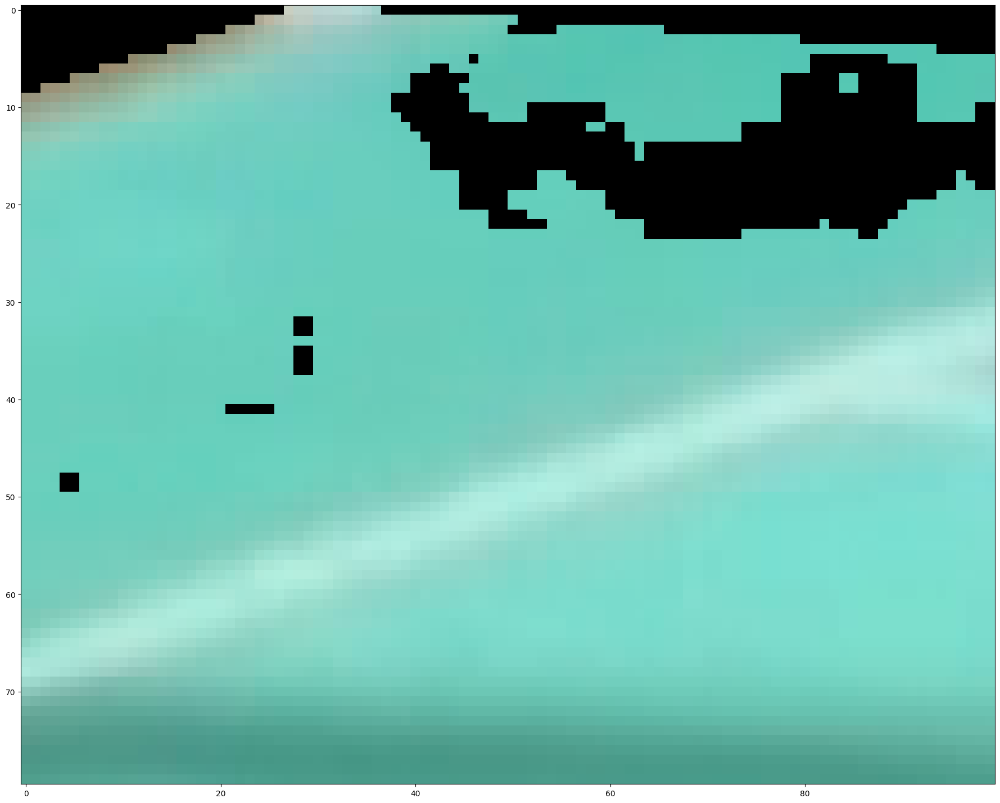

In [9]:
temp = filtered_player_image.copy()[0:80, 900:1000]
for x, y, z in zip(*np.where(temp != (0, 0, 0))):
    print(temp[x, y, :])
    print(temp[x, y, 0] < 70 and temp[x, y, 2] > 180 and temp[x, y, 1] > 180)
    if temp[x, y, 0] < 100 and temp[x, y, 1] > 180 and temp[x, y, 2] > 180:
        temp[x, y, :] = (0, 0, 0)

plt.imshow(temp)

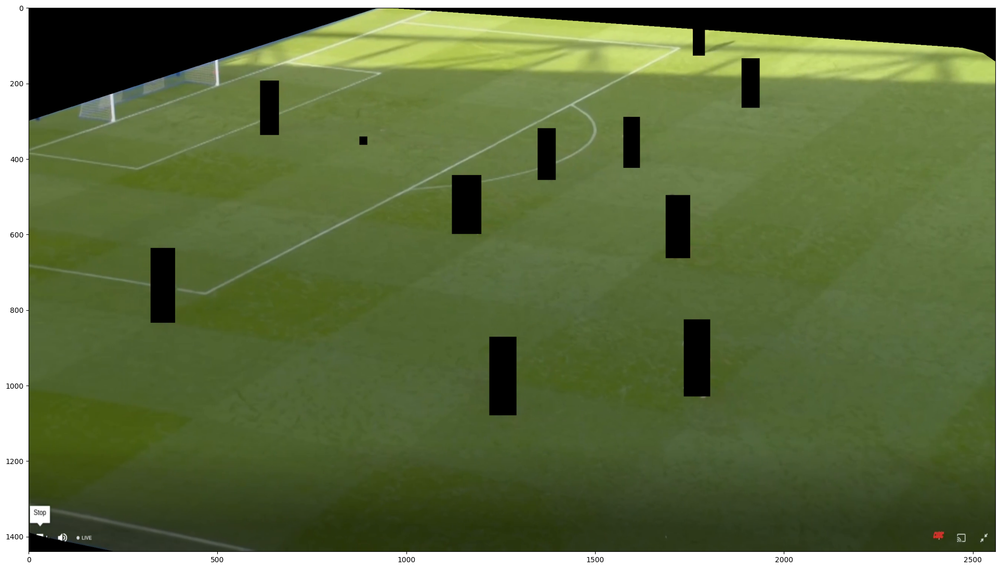

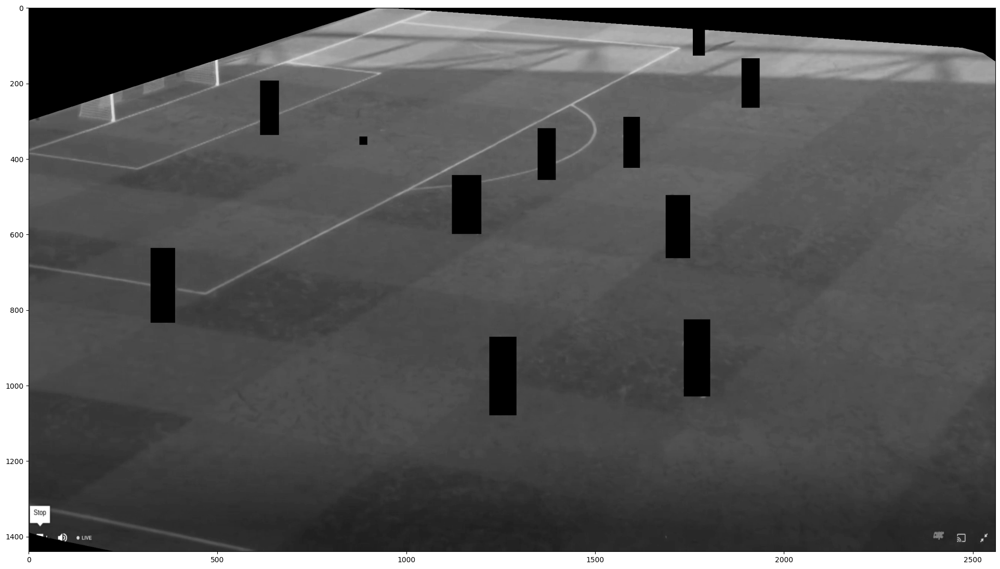

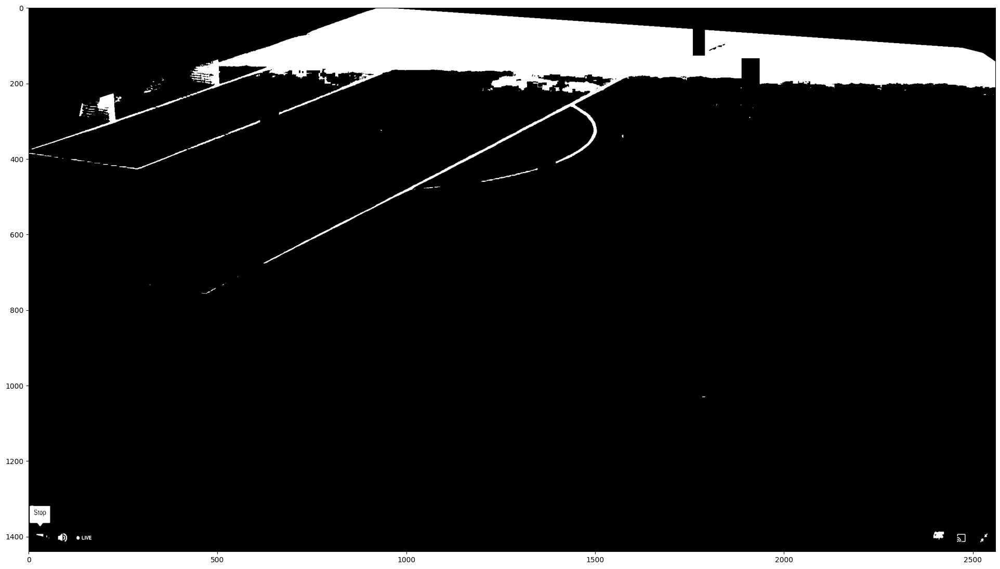

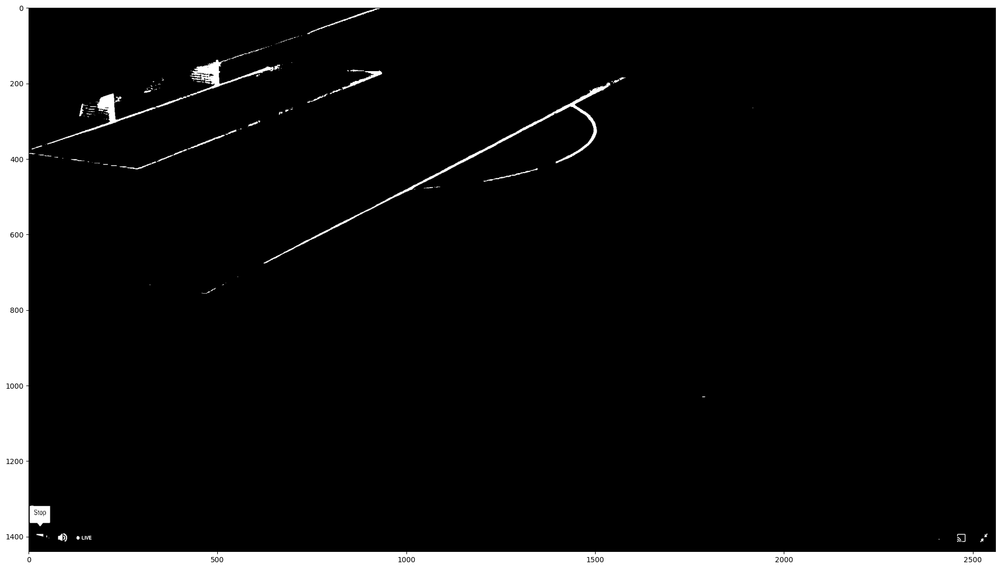

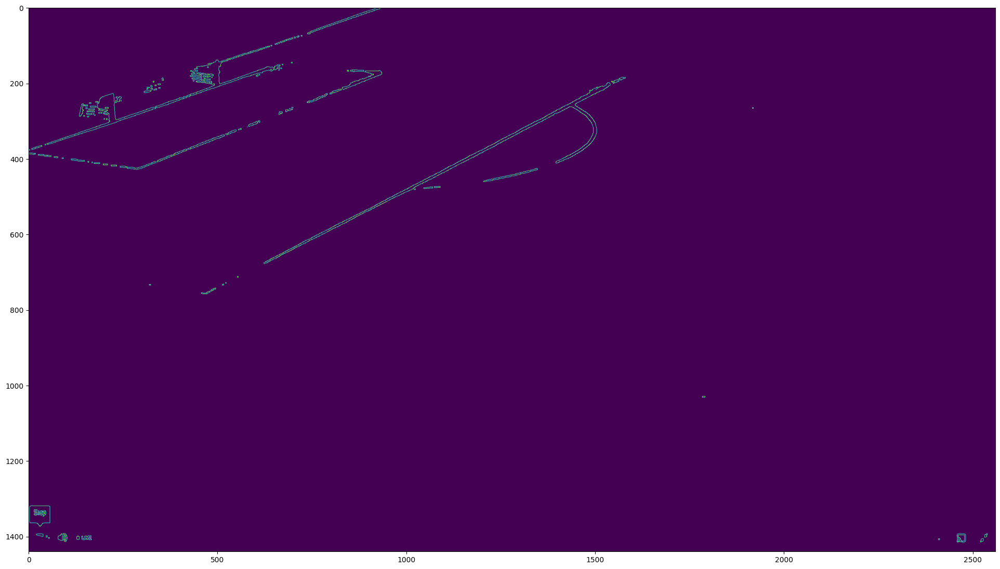

In [11]:
plt.figure()
plt.imshow(filtered_player_image[:, :, ::-1])

hls_image = cv2.cvtColor(filtered_player_image, cv2.COLOR_RGB2HLS)
lightness = hls_image[:,:, 1]
plt.figure()
plt.imshow(lightness, cmap='gray')

lightness = filtered_player_image[:, :, 2]

lower_light = 120
higher_light = 255

mask_light = cv2.inRange(lightness, lower_light, higher_light)
plt.figure()
plt.imshow(mask_light, cmap='gray')

temp = filtered_player_image.copy()
indices = zip(*np.where(mask_light == 255))
for x, y in indices:
    b, g, r = temp[x, y, :].astype(np.float32)
    mean_blue = (g+r)/2
    if mean_blue - 40 <= b <= mean_blue + 25:
        mask_light[x, y] = 255
    else:
        mask_light[x, y] = 0
    # if temp[x, y, 0] < 230 and temp[x, y, 2] < 230 and temp[x, y, 1] < 230:
    #     mask_light[x, y] = 0
    # elif temp[x, y, 0] <= temp[x, y, 2] > 130 and 180 >= temp[x, y, 1] > 130:
    #     mask_light[x, y] = 0
plt.figure()
plt.imshow(mask_light, cmap='gray')

# Canny Edge detection
sigma = 0.5
v = np.median(mask_light)
lower = int(max(0, (1.0 - sigma) * v)) - 20
upper = int(min(255, (1.0 + sigma) * v))

kernel = np.ones((3, 3), np.uint8) 

process_cropped_image = cv2.GaussianBlur(mask_light, (5, 5), 0)#cv2.medianBlur(cv2.erode(mask_light, kernel, iterations=1), 3)
#plt.figure()
#plt.imshow(process_cropped_image)

edges = cv2.Canny(process_cropped_image, lower, upper)
plt.figure()
plt.imshow(edges)

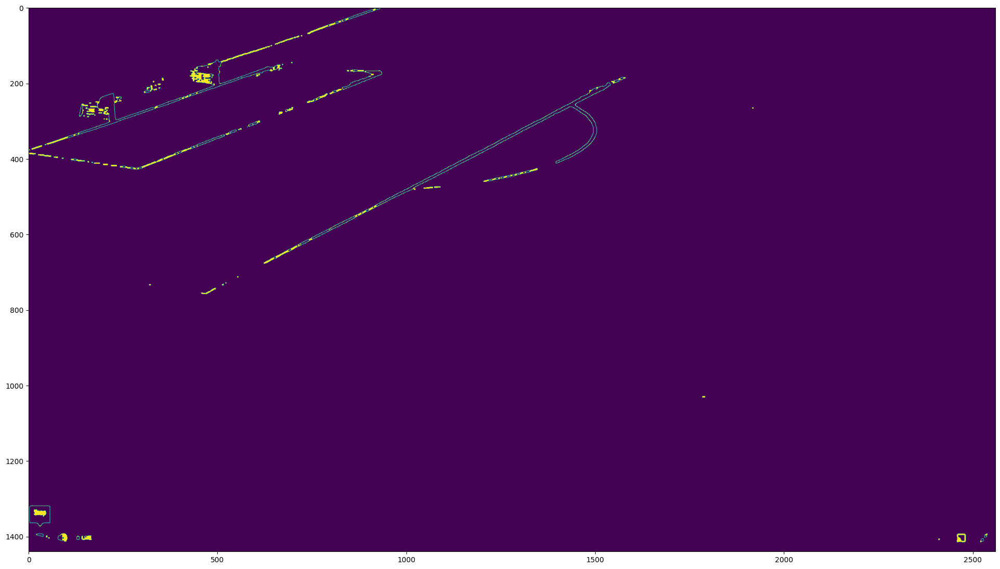

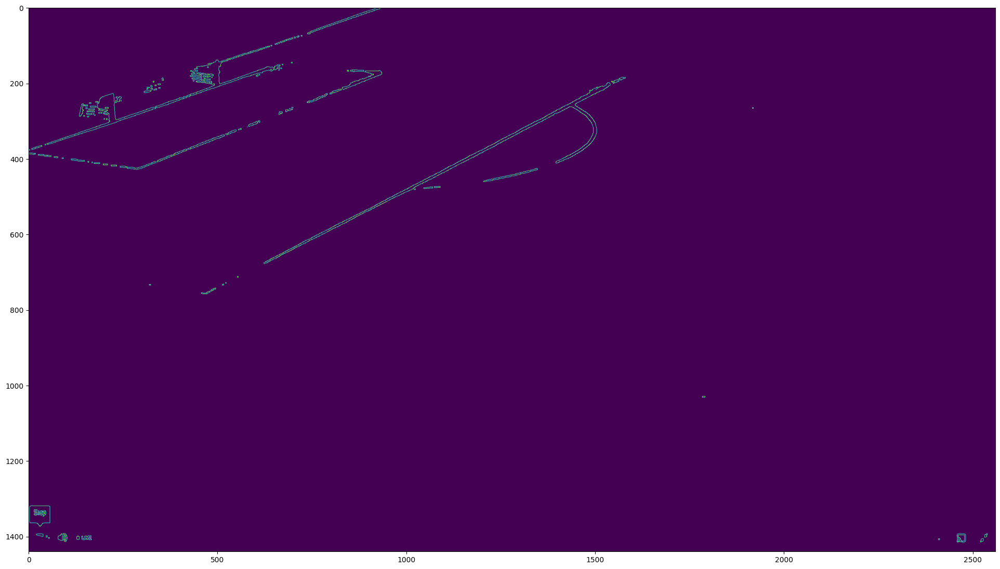

In [12]:
kernelOpen=np.ones((1,1))
kernelClose=np.ones((3,3))

maskOpen=cv2.morphologyEx(edges,cv2.MORPH_OPEN,kernelOpen)
maskClose=cv2.morphologyEx(maskOpen,cv2.MORPH_CLOSE,kernelClose)
plt.figure()
plt.imshow(maskOpen)

82
19.00717228892439
8.841814560191672
8.74616226255521
18.82471001824007
9.025727414811836
18.71173787509977
18.811889302519145
8.820379552021057
18.940062256353198
13.309178695400478
12.994616791916505
13.706961004079808
21.336859291805652
19.033316410219367
18.77803322244554
21.01409632320543
20.978601135103847
21.06135446121276
21.11037547895116
21.11037547895116
21.522600107907078
17.91644913563134
20.973493421320804
17.942447089158676
22.34064795999414
1.5693548047489854
1.6602823689828055
13.28486648490219
13.465208094811707
13.240519915187205
13.055247223796602
11.802434207783548
11.802434207783548
11.129189289611187
25.82099197418928
19.486129572465757
18.88608736970929
18.72578784527256
18.959103893169626
18.939004260240065
21.60552724263848
18.939004260240065
13.869686438505038
19.04662429763581
13.912494676520021
19.02057523772973
26.003345844511443
25.942295489871672
25.974393962431318
27.041937259127515
26.306963825741803
19.04662429763581
26.956587994668727
20.7540713187

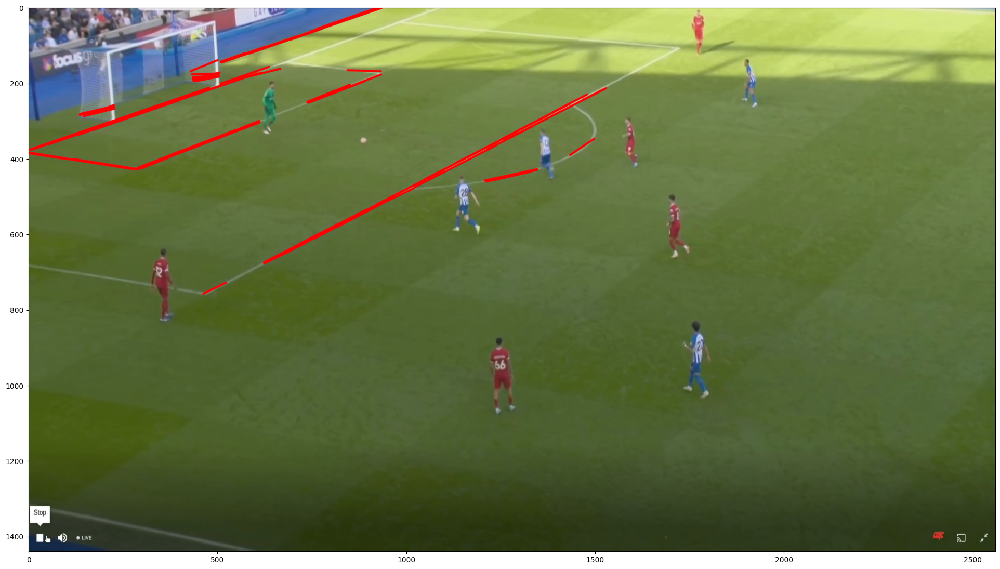

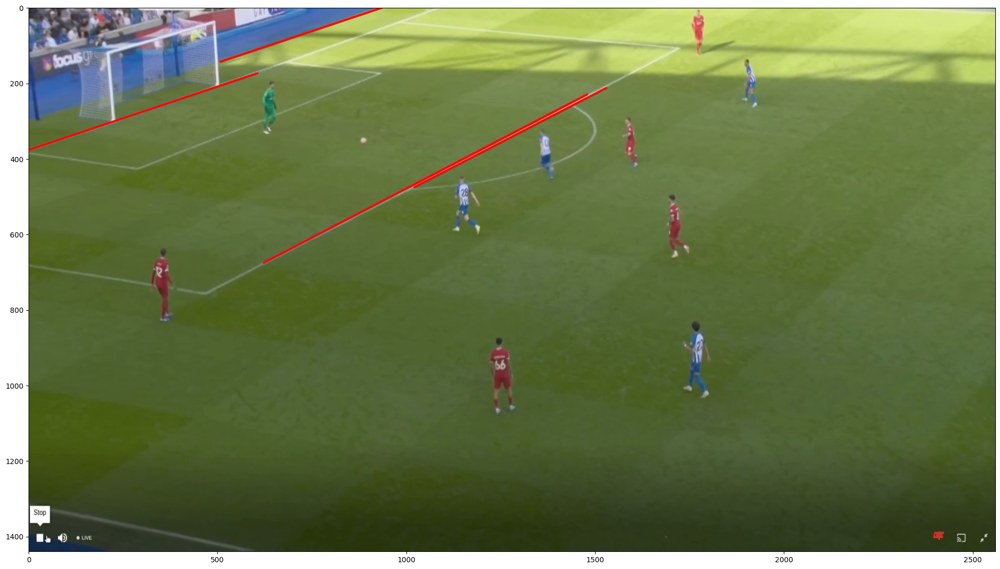

In [22]:
lines = cv2.HoughLinesP(maskClose, 1, np.pi / 180, threshold=50, minLineLength=60, maxLineGap=20)
print(len(lines))
temp = cropped_image.copy()
if lines is not None:
    for line in lines:
        cv2.line(temp, (line[0][0], line[0][1]), (line[0][2], line[0][3]), (0,0,255), 3, cv2.LINE_AA)
plt.figure()
plt.imshow(temp[:,:,::-1])

bundler = HoughBundler(min_distance=5, min_angle=1)
lines = bundler.process_lines(sorted(lines, key=lambda x: x[0][0]))
temp = cropped_image.copy()
final_lines = []
if lines is not None:
    for line in lines:
        pt1, pt2 = np.array([line[0][0], line[0][1]]), np.array([line[0][2], line[0][3]])
        _, length = angle_and_distance(pt1, pt2)
        if length > 400:
            cv2.line(temp, pt1, pt2, (0, 0, 255), 4, cv2.LINE_AA)
            final_lines.append(line)

plt.figure()
plt.imshow(temp[:,:,::-1])


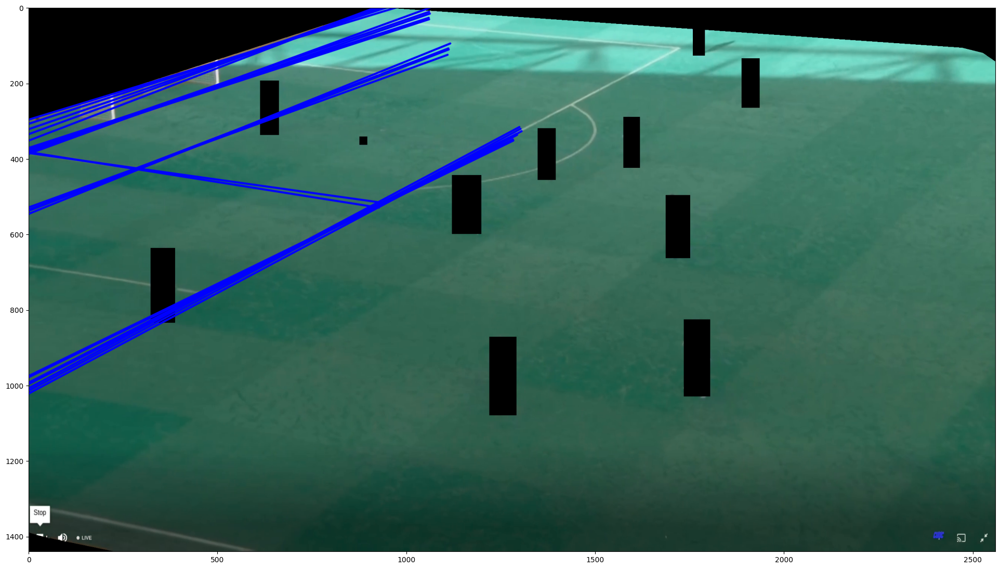

In [17]:
temp = filtered_player_image.copy()
lines = cv2.HoughLines(maskClose, 1, np.pi / 180, 180)

if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
plt.imshow(temp)